# Week3 构造情感分析工具

## 任务描述

情绪理解是文本处理里最常见任务之一。现提供一个五类情绪字典（由情绪词组成，5个文件，人工标注），实现一个情绪分析工具，并利用该工具对5000条新浪微博进行测试和分析（一行一条微博）。微博数据见课程中心weibo.txt，字典数据见论文（https://arxiv.org/abs/2004.10399）公开数据中的emotion lexicon（https://doi.org/10.6084/m9.figshare.12163569.v2）。

## 任务目标及其要求

1. 对微博数据进行清洗，去除噪声，过滤停用词。注意分词的时候应该将情绪词典加入Jieba的自定义词典，以提高这些词的识别能力。
2. 微博中包含时间，可以讨论不同时间情绪比例的变化趋势，观察并分析小时模式等。
3. 微博中包含空间，可以讨论情绪的空间分布，或得不同时间的空间分布。注意情绪的坐标可能需要进行转换，要实现一个函数进行经纬度的转换（网上一般戏称火星坐标），且要求该函数体现多参数，默认参数等特性。
4. 实现情绪分析工具。两种方法，一是认为一条微博的情绪是混合的，即一共有n个情绪词，如果Joy有n1个，则joy的比例是n1/n；二是认为一条微博的情绪是唯一的，即n个情绪词里，anger的情绪词最多，则该微博的情绪应该为angry。要求用闭包实现，尤其是要利用闭包实现一次加载且局部变量持久化的特点。
5. 4里的分析工具要考虑一些特别的情况，如无情绪词出现，不同情绪的情绪词出现数目一样等，并予以处理。
6. （附加）讨论字典方法进行情绪理解的优缺点，有无可能进一步扩充字典来提高情绪识别的准确率？
7. （附加）可否对情绪的空间分布进行动态可视化？（folium 或 pyecharts(注意版本的兼容性)）
8. （附加）这个工具还能有更多的应用场景吗？

## 报告说明
本报告为Jupyter Notebook直接导出

每个部分用三个cell来表示：代码块、运行结果块、分析说明块 

注：并非所有部分都包含三个cell

In [1]:
# 引入相关库
import pandas as pd
import re
import pkuseg as ps
from tqdm import tqdm
import matplotlib.pyplot as plt
import math
import folium
import webbrowser
import numpy as np

首先引入相关的库

- pandas和numpy作为科学计算的基本库，几乎是每个数据处理程序必不可少的库
- re为python自带的处理正则表达式的库 用于筛选博文后面的网址
- pkuseg是北京大学开发的分词库，整体的分词效果比jieba好一点，因此这次我选择使用这个库进行分词
- tqdm库可以看查循环的运行时间
- plt是画图的库就不用多说了吧
- math库中有许多数学的函数，在坐标转换的时候需要用到
- folium库是一个包含开源地图的库，可以用它进行地区情绪可视化
- webbrowser库是个和网络浏览器有关的库 应该是保存html文件的时候需要用到

In [2]:
# 载入数据 使用本地载入
def load_data(path,flag = 0):
    '''
    实现本地数据的读取
    :param path: 要读取的文件所在的路径
    :param flag: 读取文件的类型，0表示txt，1表示tsv
    :return: 文件内容按行分割后生成的列表
    '''
    with open(path,'r',encoding='utf-8') as f:
        lines = f.read().strip().split('\n')
    if flag:
        res = []
        for i in lines:
            res.append(i.split('\t'))
        return res
    else:
        return lines

wb = load_data(r'./data/weibo.txt',flag = 1)

wb[-5:]

[['这一天打了半年的喷嚏，喷的自己都晕～[感冒][感冒][感冒]@月小乐娃不能笑话你了～http://t.cn/RveDqYX',
  '116.41497',
  '39.84907',
  'Tue Jul 08 22:12:05 +0800 2014'],
 ['巴西一定要夺冠，民众才不会骚乱。虽然现在舆论都看扁巴西，但是五星巴西比三星德国多那两颗星，还是有原因的。加油，桑巴军团！http://t.cn/RvedakG',
  '116.421097',
  '39.844898',
  'Tue Jul 08 21:21:39 +0800 2014'],
 ['真的是这样的结尾，现实生活中也就罢了，电视剧还整这么虐心的结局，你特么对得起日夜等待更新的观众么[泪][泪]http://t.cn/z8LuB2l',
  '116.426651',
  '39.84391',
  'Tue Jul 08 21:17:28 +0800 2014'],
 ['几个意思呀？昨天看着心爱的人忍受肚胀之痛，今天又轮到了我，不过也让我感受到了她的痛，加在我一人身上多好，斗大的汗珠掉吧！帮我减肥，以便达到目标。http://t.cn/z8Aqwp6',
  '116.422218',
  '39.842724',
  'Tue Jul 08 21:16:41 +0800 2014'],
 ['18这是神马可乐……非要点!非要点!败家，比我还败家我在:http://t.cn/RveB4kw',
  '116.414642',
  '39.850257',
  'Tue Jul 08 20:40:25 +0800 2014']]

进行数据的读取

本次选择的读取方式为本地读取，因为后面读取字典的时候也需要用到，所以就统一在本地实现了。

直接使用open函数打开文件进行读取就好，用读取模式，注意由于文件使用的编码格式是utf-8，所以这里也要把格式对应正确，否则程序会抛出异常

因为要读取的文件的格式不同，所以设置一个flag来区分不同类型的文件（本次作业主要涉及的文件类型有tsv和txt）

最后展示读入微博数据的后几行 基本数据格式是 ['博文+网址','经度','纬度','时间']

In [3]:
# 使用正则库去除噪声
# 剔除掉除文字之外的其他信息

def remove_date(data_list):
    '''
    实现对文本信息的提取
    :param data_list: 博文信息列表
    :return: 仅包含文本信息的列表
    '''
    res = []
    for i in data_list:
        try:
            end_index = re.search(r'https?://t.cn[A-Za-z0-9/.]*',i[0]).span()[0]
            res.append(i[0][:end_index])
        except AttributeError:
            res.append(i[0])
    return res

wb_ap = remove_date(wb)

wb_ap[-5:]

['这一天打了半年的喷嚏，喷的自己都晕～[感冒][感冒][感冒]@月小乐娃不能笑话你了～',
 '巴西一定要夺冠，民众才不会骚乱。虽然现在舆论都看扁巴西，但是五星巴西比三星德国多那两颗星，还是有原因的。加油，桑巴军团！',
 '真的是这样的结尾，现实生活中也就罢了，电视剧还整这么虐心的结局，你特么对得起日夜等待更新的观众么[泪][泪]',
 '几个意思呀？昨天看着心爱的人忍受肚胀之痛，今天又轮到了我，不过也让我感受到了她的痛，加在我一人身上多好，斗大的汗珠掉吧！帮我减肥，以便达到目标。',
 '18这是神马可乐……非要点!非要点!败家，比我还败家我在:']

由于博文最后带有网址，但这对情绪分析并没有正向的帮助，因此考虑去除网址。

由于网址的长度并不相同，我们无法使用简单的字符串切片方式进行处理。不过经过观察后发现，可以发现所有的数据中传输协议和二级域名都是一样的，因此可以利用这个特点，使用正则表达式匹配符合条件的字符然后进行降噪。

函数中使用了try-except结构，因为有少量的博文不包含网址，故会抛出异常，利用这个结构捕捉异常有利于程序的稳健性。

最后展示的运行结果是去除网址之后的部分数据

In [4]:
# 处理文本 包括中英文去标点符号 英文去大小写等
def remove_punctuation(data):
    '''
    实现对文本信息中标点符号的去除
    :param data: 仅包含文本信息的列表
    :return: 仅包含文本信息并去除标点符号的列表
    '''
    punctuation = '''`~!@#$%^&*()-=_+\[\]{}|;:,.<>/?·！￥……（）【】‘“《》，。、？"：；～'\\ '''
    res = []
    for i in data:
        res.append(re.sub(r'[{}]+'.format(punctuation),' ',i).lower())
    return res

wb_ow = remove_punctuation(wb_ap)

wb_ow[-5:]

['这一天打了半年的喷嚏 喷的自己都晕 感冒 感冒 感冒 月小乐娃不能笑话你了 ',
 '巴西一定要夺冠 民众才不会骚乱 虽然现在舆论都看扁巴西 但是五星巴西比三星德国多那两颗星 还是有原因的 加油 桑巴军团 ',
 '真的是这样的结尾 现实生活中也就罢了 电视剧还整这么虐心的结局 你特么对得起日夜等待更新的观众么 泪 泪 ',
 '几个意思呀 昨天看着心爱的人忍受肚胀之痛 今天又轮到了我 不过也让我感受到了她的痛 加在我一人身上多好 斗大的汗珠掉吧 帮我减肥 以便达到目标 ',
 ' 这是神马可乐 非要点 非要点 败家 比我还败家我在 ']

为了进一步减少噪音，我考虑把每条微博中的标点符号都去掉。

采用的方式类似上周作业，利用正则表达式将标点符号全部替换成空格，并将所有的英文字符转换成小写（大小写转换是为了方便进行词频统计，在本次作业中并没有实际用处）。

最后的结果展示的是除去标点之后的部分数据。

In [5]:
# 进行分词 并导入
# 本次分词使用的库并非是jieba 而是北京大学开发的中文分词库pkuseg https://github.com/lancopku/pkuseg-python
# 该分词包的web模型使用微博语料进行预训练，因此更适合本题。 但我好像发现用默认模式分词更好一点

def cut_word(df):
    '''
    实现对文本信息的分词
    :param df: 仅包含文本信息的列表 （去掉标点符号后）
    :return: 将文本信息进行分词后的列表
    '''
    res = []
    seg = ps.pkuseg(model_name = "default", user_dict = r'./data/emotion_dict/total.txt', postag = False)
    for i in tqdm(df):
        res.append(seg.cut(i))
    return res

wb_cut = cut_word(wb_ow)

wb_cut[-5:]

100%|██████████| 5000/5000 [00:03<00:00, 1502.53it/s]


[['这',
  '一',
  '天',
  '打',
  '了',
  '半年',
  '的',
  '喷嚏',
  '喷',
  '的',
  '自己',
  '都',
  '晕',
  '感冒',
  '感冒',
  '感冒',
  '月',
  '小',
  '乐娃',
  '不',
  '能',
  '笑',
  '话',
  '你',
  '了'],
 ['巴西',
  '一定',
  '要',
  '夺冠',
  '民众',
  '才',
  '不',
  '会',
  '骚',
  '乱',
  '虽然',
  '现在',
  '舆论',
  '都',
  '看扁',
  '巴西',
  '但是',
  '五星',
  '巴西',
  '比',
  '三星',
  '德国',
  '多',
  '那',
  '两',
  '颗',
  '星',
  '还是',
  '有',
  '原因',
  '的',
  '加油',
  '桑巴',
  '军团'],
 ['真的',
  '是',
  '这样',
  '的',
  '结尾',
  '现实',
  '生活',
  '中',
  '也',
  '就',
  '罢了',
  '电视剧',
  '还',
  '整',
  '这么',
  '虐心',
  '的',
  '结局',
  '你',
  '特么',
  '对得起',
  '日夜',
  '等待',
  '更新',
  '的',
  '观众',
  '么',
  '泪',
  '泪'],
 ['几',
  '个',
  '意思',
  '呀',
  '昨天',
  '看',
  '着',
  '心爱',
  '的',
  '人',
  '忍受',
  '肚胀',
  '之',
  '痛',
  '今天',
  '又',
  '轮到',
  '了',
  '我',
  '不过',
  '也',
  '让',
  '我',
  '感受',
  '到',
  '了',
  '她',
  '的',
  '痛',
  '加',
  '在',
  '我',
  '一',
  '人身',
  '上',
  '多',
  '好',
  '斗',
  '大',
  '的',
  '汗',
  '珠掉',
  '吧',
  '帮',
  '我',
  '减肥',
  '

去除标点符号后进行分词

本次分词并未采用常用的jieba库，而是找到了北京大学在github上的一个开源项目pkuseg，据了解该库在常见语料上的分词效果要好于jieba，并且还可以根据不同的场景训练不同的分词模型，其中有一个场景即为web分词，刚好符合微博互联网数据的特点。基于以上原因，我选择pkuseg库作为本次分词的第三方库。

在分词时，为了提高后续情绪识别的准确性，避免表示情绪的词语被意外分开，我提前将用于情绪识别的词典加入到了分词的词典中以达到上述目的。

最后的结果展示的是分词后部分数据

In [6]:
# 过滤停用词
def refresh_stopwords_list():
    '''
    更新停用词表
    :return: 停用词表
    '''
    with open(r'.\data\stopwords_list.txt','r') as f:
        sl = f.read().strip().split('\n')
    return sl

def filter_stopwords(data,sw_list,ignore_list):
    '''
    实现对分词后文本信息中停用词的过滤
    :param data: 文本信息分词后的列表
    :param sw_list: 停用词表
    :param ignore_list: 反停用词表（即情绪词典）
    :return: 过滤停用词后的文本信息列表
    '''
    res = []
    for i in tqdm(data):
        temp = []
        for j in i:
            if (j not in sw_list) or (j in ignore_list):
                temp.append(j)
        res.append(temp)
    return res

sl = refresh_stopwords_list()
il = load_data(r'./data/emotion_dict/total.txt')
wb_fst = filter_stopwords(wb_cut,sl,il)

wb_fst[-5:]

100%|██████████| 5000/5000 [00:07<00:00, 702.38it/s]


[['天', '半年', '喷嚏', '喷', '晕', '感冒', '感冒', '感冒', '乐娃', '笑', '话'],
 ['巴西',
  '夺冠',
  '民众',
  '骚',
  '乱',
  '舆论',
  '看扁',
  '巴西',
  '五星',
  '巴西',
  '三星',
  '德国',
  '两',
  '颗',
  '星',
  '原因',
  '加油',
  '桑巴',
  '军团'],
 ['真的',
  '结尾',
  '现实',
  '生活',
  '中',
  '电视剧',
  '整',
  '虐心',
  '结局',
  '特么',
  '对得起',
  '日夜',
  '等待',
  '更新',
  '观众',
  '泪',
  '泪'],
 ['昨天',
  '心爱',
  '忍受',
  '肚胀',
  '痛',
  '轮到',
  '感受',
  '痛',
  '加',
  '人身',
  '斗',
  '汗',
  '珠掉',
  '帮',
  '减肥',
  '目标'],
 ['这是', '神马可乐', '非要点', '非要点', '败家', '败家']]

过滤停用词

利用上周老师给的停用词表对停用词进行过滤，不过并不是进行简单的过滤，因为有些停用词与情绪识别字典中的词是重合的，因此需要对情绪字典中的词进行保护，故加入了反停用词列表。
具体的逻辑是这样的：我们拿到一个词后，首先判断其是否属于停用词，如果不属于则直接放入结果列表，如果属于则进行进一步的操作，判断其是否属于情绪词典，如果属于则放入结果列表，如果不属于就跳过，进行下一个词的判断。

结果展示的是分词后的部分数据

In [7]:
# 进行情绪分析
# 基于现实情况考虑 我们认为情感倾向是多维的 因此每一条情感的输出都是一个5维向量 分别代表该条中每个情感所占的比例
# 但为了方便后面分析 我们将该条情感向量中最大的量作为主情感 后面的时空分析均是基于主情感展开的
# 要求使用闭包实现
# 返回的list 指 生气 厌恶 害怕 开心 失望

def emotional_tag():
    anger_list = load_data(r'./data/emotion_dict/anger.txt')
    disgust_list = load_data(r'./data/emotion_dict/disgust.txt')
    fear_list = load_data(r'./data/emotion_dict/fear.txt')
    joy_list = load_data(r'./data/emotion_dict/joy.txt')
    sadness_list = load_data(r'./data/emotion_dict/sadness.txt')

    def tagging(data):
        em_list = [0 for _ in range(5)]
        for i in data:
            if i in anger_list:
                em_list[0] += 1
            elif i in disgust_list:
                em_list[1] += 1
            elif i in fear_list:
                em_list[2] += 1
            elif i in joy_list:
                em_list[3] += 1
            elif i in sadness_list:
                em_list[4] += 1
            else:
                pass
        return em_list
    return tagging

def emotional_analysis(data_list):
    '''
    实现情绪文本向量化
    :param data_list: 要进行情绪向量化的文本列表
    :return: 文本情绪向量化列表
    '''
    ea_tools = emotional_tag()
    res = []
    for i in tqdm(data_list):
        res.append(ea_tools(i))
    return res

wb_ea = emotional_analysis(wb_fst)

wb_ea[-5:]

100%|██████████| 5000/5000 [00:03<00:00, 1404.10it/s]


[[0, 1, 0, 0, 4],
 [0, 2, 1, 2, 0],
 [0, 0, 0, 0, 5],
 [0, 0, 0, 1, 0],
 [2, 0, 0, 0, 0]]

进行文本的情绪识别，首先进行的是情绪文本的向量化处理。

这里使用的向量化方式比较简单，每条文本使用一个五维向量来代替，每一维分别代表一个情绪，数值表示该情绪在当前的文本中出现的次数。
在拿到一个词后，如果这个词存在于某个情绪字典中，则认为该文本对这个情绪有所体现，该文本对应情绪维度的数值加一。
对每条文本中的每个词进行扫描，即可将该文本转换成向量。

为了减少内存的占用，我们在对所有文本进行识别的时候，令每个情绪词典仅加载一次。通过函数的闭包即可实现该操作，首先在外层函数中对情绪词典进行加载，然后在内层函数进行文本情绪向量化。调用的时候先初始化一个外层函数，再利用返回的内层函数进行情绪向量化转换，就可以达到只加载一次数据而进行多次转换的效果了。

结果展示的是部分向量化后的向量数据


In [8]:
# 将情绪向量转换为标签
# 单一情绪词 表示为 single 单一
# 未出现情绪词 表示为 peace 平静
# 多个情绪词相同得分表示为 mix 混合
# 返回形式为列表 第一个词为标识位 剩余词为情感标签

def give_em_tag(em_vec):
    '''
    根据向量表情进行情绪标注
    :param em_vec: 向量化的情绪列表
    :return: 情绪标注的结果列表
    '''
    flag = ['single','peace','mix']
    em_ = ['anger','disgust','fear','joy','sadness']
    res = []
    for vec in em_vec:
        temp = []
        max_em = max(vec)
        if max_em:
            if vec.count(max_em) == 1:
                temp.append(flag[0])
                temp.append(em_[vec.index(max_em)])
            else:
                temp.append(flag[2])
                for i in range(len(vec)):
                    if vec[i] == max_em:
                        temp.append(em_[i])
        else:
            temp.append(flag[1])
        res.append(temp)
    return res

wb_emtag = give_em_tag(wb_ea)

wb_emtag[-5:]

[['single', 'sadness'],
 ['mix', 'disgust', 'joy'],
 ['single', 'sadness'],
 ['single', 'joy'],
 ['single', 'anger']]

根据情绪向量进行情绪标注

标注规则如下：如果情绪向量为0向量，则标记该文本情绪类型为’peace‘，即没有情绪；如果情绪向量为非零向量，则分下列两种情况：若向量中有唯一最大值，则标记该文本情绪类型为’single‘，即单一情绪，并且选取最大值对应的情绪作为该文本的情绪；若向量中有多个最大值，则标记该文本的情绪类型为’mix‘，即混合情绪，并且选取所有最大值对应的情绪作为该文本的情绪。

结果展示的是情绪的标注后的部分结果。

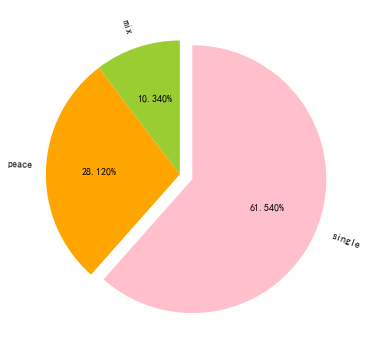

In [9]:
%matplotlib inline
# 根据情绪类别简单分析
def simple_plot(data):
    flag = ['single','peace','mix']
    res = [0 for _ in range(3)]
    for i in data:
        if i[0] == 'single':
            res[0] += 1
        elif i[0] == 'peace':
            res[1] += 1
        else:
            res[2] += 1
    explode = (0.1,0,0)
    plt.rcParams['font.sans-serif']=['SimHei'] #解决中文乱码
    plt.figure(figsize=(6,9)) #调节图形大小
    plt.pie(res,
        explode = explode,
        labels = flag,
        colors = ['pink','orange','yellowgreen'],
        shadow = False, #无阴影设置
        startangle =90, #逆时针起始角度设置
        counterclock = False,#顺时针
        autopct = '%.3f%%',
        rotatelabels = True) #标签指向轴心 
    plt.savefig(r'.\img\大情绪分类饼图.png', dpi=300)
    plt.show()

simple_plot(wb_emtag)

对情绪类别进行了简单的可视化

可以看到在全部文本中，单一情绪类别的文本占到了六成左右，混合情绪文本只有一成，而没有情绪的文本接近三成。

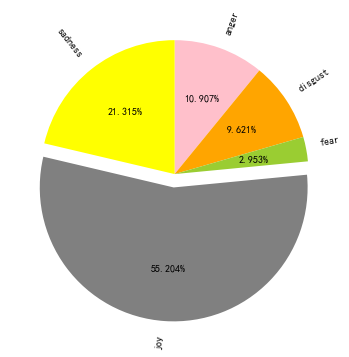

In [10]:
# 根据情绪标签进行画图
# 有标签的按标签分类 没有的忽略

def tag_plot(data):
    em_ = ['anger','disgust','fear','joy','sadness']
    res = [0 for _ in range(5)]
    for i in data:
        if i[0] == 'single':
            res[em_.index(i[1])] += 1
        elif i[0] == 'peace':
            pass
        else:
            for j in i[1:]:
                res[em_.index(j)] += 1
    explode = (0,0,0,0.1,0)
    plt.rcParams['font.sans-serif']=['SimHei'] #解决中文乱码
    plt.figure(figsize=(6,9)) #调节图形大小
    plt.pie(res,
        explode = explode,
        labels = em_,
        colors = ['pink','orange','yellowgreen','gray','yellow'],
        shadow = False, #无阴影设置
        startangle =90, #逆时针起始角度设置
        counterclock = False,#顺时针
        autopct = '%.3f%%',
        rotatelabels = True) #标签指向轴心
    plt.savefig(r'.\img\小情绪分类饼图.png', dpi=300)
    plt.show()

tag_plot(wb_emtag)

对情绪标签进行了简单的饼图分析

可以发现，这些文本中大部分还都表现出快乐的情绪，这符合我们日常上网’把快乐分享出去，把悲伤留给自己‘的习惯。另外除快乐之外，伤心也占据了接近两成的比例，平时浏览微博的时候确实也可以看到许多伤心的博文。总而言之，这个比例还是在我意料之中的，符合我的日常认知。

In [11]:
# 微博中包含时间，可以讨论不同时间情绪比例的变化趋势，观察并分析小时模式等。
# 结合时间进行分析
# 首先提取时间

def extract_time(data,em_list):
    '''
    提取情绪标签与时间信息
    :param data: 包含全部信息的文本列表
    :param em_list: 情绪标签列表
    :return: 时间信息与情绪标签列表
    '''
    res = []
    for i in range(len(data)):
        res.append([data[i][-1].split(),em_list[i]])
    return res

wb_time = extract_time(wb,wb_emtag)

wb_time[-5:]

[[['Tue', 'Jul', '08', '22:12:05', '+0800', '2014'], ['single', 'sadness']],
 [['Tue', 'Jul', '08', '21:21:39', '+0800', '2014'],
  ['mix', 'disgust', 'joy']],
 [['Tue', 'Jul', '08', '21:17:28', '+0800', '2014'], ['single', 'sadness']],
 [['Tue', 'Jul', '08', '21:16:41', '+0800', '2014'], ['single', 'joy']],
 [['Tue', 'Jul', '08', '20:40:25', '+0800', '2014'], ['single', 'anger']]]

为了建立小时模型，将情绪标签与时间信息提取，合并成一个列表。

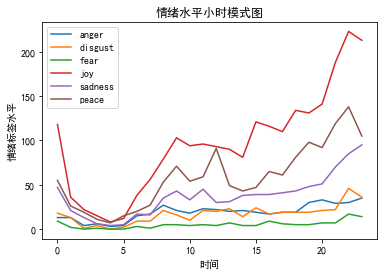

In [12]:
# 经过验证 该数据集为东八区连续两天的数据 因此适合进行小时分析

def time_plot(data):
    em_ = ['anger','disgust','fear','joy','sadness','peace']
    time_box = [[0 for _ in range(24)] for __ in range(6)]
    for i in data:
        hour_index = int(i[0][3][:2])
        em = i[1]
        if em[0] == 'single':
            time_box[em_.index(em[1])][hour_index] += 1
        elif em[0] == 'peace':
            time_box[em_.index(em[0])][hour_index] += 1
        else:
            for j in em[1:]:
                time_box[em_.index(j)][hour_index] += 1
    for i in range(6):
        plt.plot(time_box[i],label = em_[i])
    plt.legend()
    plt.xlabel("时间") #X轴标签
    plt.ylabel("情绪标签水平") #Y轴标签
    plt.title('情绪水平小时模式图')
    plt.savefig(r'.\img\情绪水平小时模式图.png', dpi=300)
    plt.show()
    return time_box

wb_time_box = time_plot(wb_time)

利用刚刚提取出的信息列表建立矩阵，画出小时模型曲线。

可以看到，不同情绪在不同时间的大体变化趋势是一样的，基本上凌晨处于谷底，毕竟那个时候大多数人在睡觉，只有少部分人在那个时候发微博。到早上五点之后，人们开始逐渐醒来，微博的数量也不断的上升，直到半夜才出现下降的趋势。

从纵向来看，快乐的情绪在全天范围内都比较高。悲伤的情绪在半夜会有一个突然的增长，这可能就是所谓的”深夜网抑云“吧。

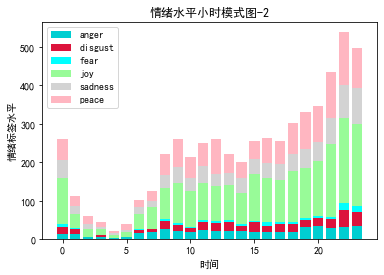

In [13]:
# 再画一个
def time_plot_2(time_box):
    em_ = ['anger','disgust','fear','joy','sadness','peace']
    color = ['#00CED1','#DC143C','#00FFFF','#98FB98','#D3D3D3','#FFB6C1']
    for i in range(6):
        plt.bar(range(len(time_box[i])), time_box[i], label = em_[i],fc = color[i],bottom = np.sum(time_box[:i], axis = 0))
    plt.legend()
    plt.xlabel("时间") #X轴标签
    plt.ylabel("情绪标签水平") #Y轴标签
    plt.title('情绪水平小时模式图-2')
    plt.savefig(r'.\img\情绪水平小时模式图_2.png', dpi=300)
    plt.show()

time_plot_2(wb_time_box)

将刚刚的情绪用柱状图的形式画出来 可以更加直观的反应不同时间博文数量的总趋势，在晚上十点的时候达到顶峰，符合认知逻辑。

In [14]:
# 空间分布
# 首先进行坐标转换 并提取坐标和情绪信息
# lng纬度 lat经度
def GCJ02_to_WGS84(gcj_lng, gcj_lat):
    '''
    实现GCJ02坐标系向WGS84坐标系的转换
    :param gcj_lng: GCJ02坐标系下的经度
    :param gcj_lat: GCJ02坐标系下的纬度
    :return: 转换后的WGS84下经纬度
    '''
    x_pi = 3.14159265358979324 * 3000.0 / 180.0
    pi = math.pi  # π
    a = 6378245.0  # 长半轴
    es = 0.00669342162296594323  # 偏心率平方

    def transformlat(lng, lat):
        ret = -100.0 + 2.0 * lng + 3.0 * lat + 0.2 * lat * lat + \
              0.1 * lng * lat + 0.2 * math.sqrt(math.fabs(lng))
        ret += (20.0 * math.sin(6.0 * lng * pi) + 20.0 *
                math.sin(2.0 * lng * pi)) * 2.0 / 3.0
        ret += (20.0 * math.sin(lat * pi) + 40.0 *
                math.sin(lat / 3.0 * pi)) * 2.0 / 3.0
        ret += (160.0 * math.sin(lat / 12.0 * pi) + 320 *
                math.sin(lat * pi / 30.0)) * 2.0 / 3.0
        return ret

    def transformlng(lng, lat):
        ret = 300.0 + lng + 2.0 * lat + 0.1 * lng * lng + \
              0.1 * lng * lat + 0.1 * math.sqrt(math.fabs(lng))
        ret += (20.0 * math.sin(6.0 * lng * pi) + 20.0 *
                math.sin(2.0 * lng * pi)) * 2.0 / 3.0
        ret += (20.0 * math.sin(lng * pi) + 40.0 *
                math.sin(lng / 3.0 * pi)) * 2.0 / 3.0
        ret += (150.0 * math.sin(lng / 12.0 * pi) + 300.0 *
                math.sin(lng / 30.0 * pi)) * 2.0 / 3.0
        return ret
    
    dlat = transformlat(gcj_lng - 105.0, gcj_lat - 35.0)
    dlng = transformlng(gcj_lng - 105.0, gcj_lat - 35.0)
    radlat = gcj_lat / 180.0 * pi
    magic = math.sin(radlat)
    magic = 1 - es * magic * magic
    sqrtmagic = math.sqrt(magic)
    dlat = (dlat * 180.0) / ((a * (1 - es)) / (magic * sqrtmagic) * pi)
    dlng = (dlng * 180.0) / (a / sqrtmagic * math.cos(radlat) * pi)
    mglat = gcj_lat + dlat
    mglng = gcj_lng + dlng
    lng = gcj_lng * 2 - mglng
    lat = gcj_lat * 2 - mglat
    return lng, lat

def extract_area(data,em_list):
    '''
    提取情绪标签与时间信息
    :param data: 包含全部信息的文本列表
    :param em_list: 情绪标签列表
    :return: 位置信息与情绪标签列表
    '''
    res = []
    for i in range(len(data)):
        res.append([GCJ02_to_WGS84(float(data[i][-2]),float(data[i][-3])),em_list[i]])
    return res

wb_area = extract_area(wb,wb_emtag)

wb_area[-5:]

[[(39.85509946474315, 116.40594738470483), ['single', 'sadness']],
 [(39.85094293438046, 116.41206979789675), ['mix', 'disgust', 'joy']],
 [(39.84995742847009, 116.41762420009182), ['single', 'sadness']],
 [(39.84877781928833, 116.41318751989674), ['single', 'joy']],
 [(39.85628173933911, 116.4056211782014), ['single', 'anger']]]

进行经纬度坐标的转换和位置信息与情绪标签信息的提取

首先是对经纬度坐标进行的处理，目前主流的经纬度坐标系有三种，分别是WGS84坐标系、GCJ02坐标系和BD09坐标系。其中WGS84坐标系也称地球坐标系，是国际通用的坐标系，大多数地图（中国部分除外）和卫星使用的都是这种坐标系；而GCJ02坐标系是由WGS84坐标系经加密后产生的坐标系，由中国国家测绘局制定，也称火星坐标系，大多是地图的中国部分都使用的是这种坐标系。
BD09坐标系是由GCJ02坐标系经二次加密后得到的坐标系，也称百度坐标系，由百度公司独创，仅在百度地图使用，由于本文并未采用百度地图进行数据收集，故不在对BD09坐标系进行赘述。
由于高德开放平台所使用的是GCJ02坐标系，而Python语言的folium库中使用的openstreetmap地图引擎是在WGS84坐标系下建立的，因此如果想实现图4的节点精准标注，必须进行不同坐标系之间的转化。

为了建立位置模型，将情绪标签与位置信息提取，合并成一个列表。

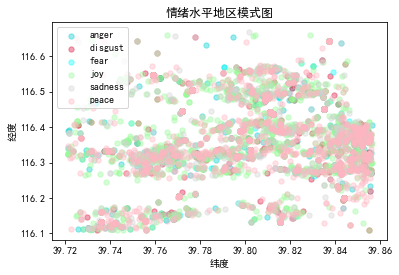

In [15]:
# 画出空间分布散点图
def area_plot(data):
    em_ = ['anger','disgust','fear','joy','sadness','peace']
    color = ['#00CED1','#DC143C','#00FFFF','#98FB98','#D3D3D3','#FFB6C1']
    area_box = [[[],[]] for _ in range(6)]
    for i in data:
        em = i[1]
        if em[0] == 'single':
            area_box[em_.index(em[1])][0].append(i[0][0])
            area_box[em_.index(em[1])][1].append(i[0][1])
        elif em[0] == 'peace':
            area_box[em_.index(em[0])][0].append(i[0][0])
            area_box[em_.index(em[0])][1].append(i[0][1])
        else:
            for j in em[1:]:
                area_box[em_.index(j)][0].append(i[0][0])
                area_box[em_.index(j)][1].append(i[0][1])
    for i in range(len(area_box)):
        plt.scatter(area_box[i][0], area_box[i][1], s=math.pi * 3**2, c=color[i], alpha=0.4, label=em_[i])
    plt.xlabel('纬度')
    plt.ylabel('经度')
    plt.title('情绪水平地区模式图')
    plt.legend()
    plt.savefig(r'.\img\情绪水平地区模式图.png', dpi=300)
    plt.show()

area_plot(wb_area)

将经纬度坐标和情绪画出来，发现情绪分布的很均匀，基本上各个地区不同情绪都有覆盖。

In [21]:
# 进行空间分布可视化
def draw_map(data):
    em_ = ['anger','disgust','fear','joy','sadness','peace']
    color = ['#00CED1','#DC143C','#00FFFF','#98FB98','#D3D3D3','#FFB6C1']
    m = folium.Map(location=[39.7853,116.3521], control_scale=True,zoom_start=12) # 绘制初始地图
    m.add_child(folium.LatLngPopup()) # 显示经纬度
    for i in tqdm(data):
        em = i[1]
        pos = i[0]
        if em[0] == 'single':
            folium.Circle(location=pos,radius=50,color=color[em_.index(em[1])],popup=em[1],fill=True).add_to(m)
        elif em[0] == 'peace':
            folium.Circle(location=pos,radius=50,color=color[em_.index(em[0])],popup=em[0],fill=True).add_to(m)
        else:
            for j in em[1:]:
                folium.Circle(location=pos,radius=50,color=color[em_.index(j)],popup=j,fill=True).add_to(m)
    for i in range(6):
        folium.FeatureGroup(name= '<span style="color: {col};">{txt}</span>'.format( txt= em_[i], col= color[i])).add_to(m)
    folium.PolyLine(locations=[[39.8586,116.1015],[39.8586,116.6721],[39.7204,116.6721],[39.7204,116.1015],[39.8586,116.1015]], color='blue').add_to(m)
    folium.map.LayerControl('topleft', collapsed= False).add_to(m) # 控制图例位置
    m.save('空间可视化.html')
    return m
        
wb_map = draw_map(wb_area)

wb_map

100%|██████████| 5000/5000 [00:00<00:00, 9754.78it/s]


利用folium库进行地图数据可视化，结果如上图展现的所示。

从整体来看还是开心的博文占据大多数，也基本覆盖到全部的区域，蓝色框框的中部地区发文数量较多。

100%|██████████| 5000/5000 [00:05<00:00, 845.56it/s]


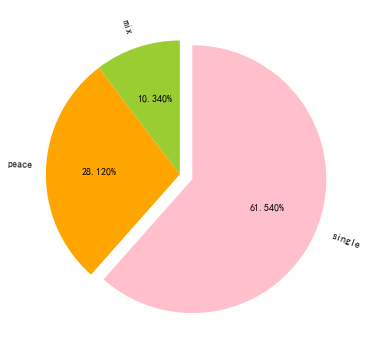

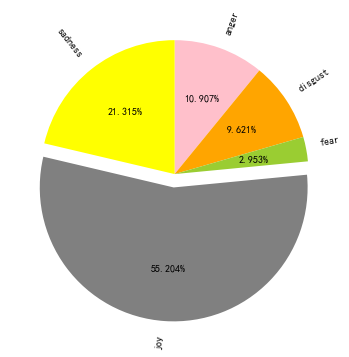

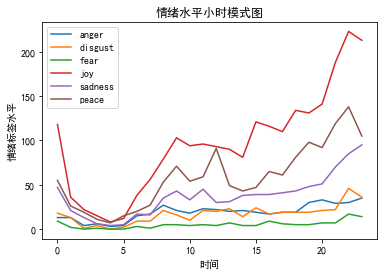

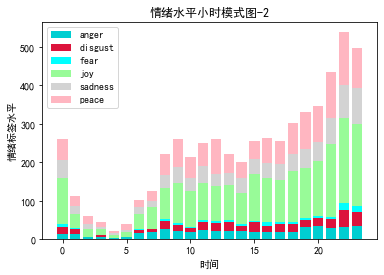

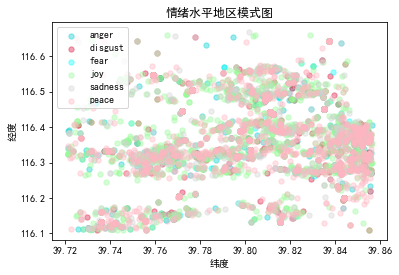

100%|██████████| 5000/5000 [00:00<00:00, 6592.07it/s]
Over


In [17]:
# 写个main函数吧（如果真的需要的话）
def main():
    wb = load_data(r'./data/weibo.txt',flag = 1)
    wb_ap = remove_date(wb)
    wb_ow = remove_punctuation(wb_ap)
    wb_cut = cut_word(wb_ow)
    sl = refresh_stopwords_list()
    il = load_data(r'./data/emotion_dict/total.txt')
    wb_fst = filter_stopwords(wb_cut,sl,il)
    wb_ea = emotional_analysis(wb_fst)
    wb_emtag = give_em_tag(wb_ea)
    simple_plot(wb_emtag)
    tag_plot(wb_emtag)
    wb_time = extract_time(wb,wb_emtag)
    wb_time_box = time_plot(wb_time)
    time_plot_2(wb_time_box)
    wb_area = extract_area(wb,wb_emtag)
    area_plot(wb_area)
    wb_map = draw_map(wb_area)
    print('Over')
    pass

if __name__ == '__main__':
    main()

将上述所有函数封装起来，写进main函数。

### 讨论题：
#### （附加）讨论字典方法进行情绪理解的优缺点，有无可能进一步扩充字典来提高情绪识别的准确率？

优点：方便简洁、容易实现、代码量较少
缺点：识别准确率不太高，字典的大小成为了识别准确率的瓶颈

我觉得通过情绪字典进行情绪识别是属于一种比较被动的识别方式，当字典达到一定规模的时候，再进行扩大字典也很难将识别准确率提高一个档次。因为人的情绪可能并不仅仅体现在用词方面，标点符号、句式长短变化都可能是不同情绪的表现，而这些内容是无法通过情绪词典捕捉到的。因此，我觉得利用主动学习的方式，比如现在常用的深度学习、神经网络模型等等，可能会对提升情绪识别准确率有一定的帮助。

#### （附加）这个工具还能有更多的应用场景吗？

情绪识别的应用场景还是比较多的，尤其是在现在人工智能发展十分迅猛的今天，其在NLP（Nature Language Process，自然语言处理）领域的用处还是很广泛的。

个人的情绪识别场景:

- 假如可以抓住微表情，可能可以发展成为测谎仪。
- 应用到心理诊所，更好的识别病人的真实心态。

群体情绪识别场景：

- 识别情绪不同，这个在教育课堂上是比较好的应用，可以检测群体和个体的课堂教育效果。找到和其他人情绪不一致程度的人（此学生可能走神了，或者跟不上节奏，或者其他的原因）。并有针对性的提醒老师调整效果或者课后补充等。
- 可以结合动作识别，在公交车上判断是否有小偷，或者安保监控是否有涉恐人员。

部分场景参考自知乎回答 https://zhuanlan.zhihu.com/p/59082165